<a href="https://colab.research.google.com/github/yongtaoliu/Forensics-DKL-BEPS/blob/main/Forensic_DKL_BEPS_maternkernel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

2022 Dec--this data is created by notebook: PTOBEPS_UsedinNMIpaper.ipynb

- Notebook by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- BEPFM and BEPS data acquired by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- Analyses by [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en) (Funding: EFRC Award Number DE-SC0021118)
- PTO sample from [Hiroshi Funakubo](https://scholar.google.co.jp/citations?user=12EJj9gAAAAJ&hl=ja)

- Project Sergei V. Kalinin, Rama Vasudevan, Maxim Ziatdinov, Yongtao Liu


## **Import and Download data**

In [1]:
#@title Install
!pip install -q git+https://github.com/pycroscopy/atomai.git
!pip install atomai
!pip install -q --upgrade git+https://github.com/ziatdinovmax/gpax
!pip install -U gdown

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.1/266.1 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.5/174.5 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.8/865.8 kB 14.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.6/304.6 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 360.3/360.3 kB 11.7 MB/s eta 0:00:00
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [2]:
#@title Import
import numpy as np
import matplotlib.pyplot as plt
import gpax
import numpyro
import jax
import jax.numpy as jnp
import math
import atomai as aoi
import torch
import os

from atomai import utils
from sklearn.model_selection import train_test_split
from IPython.display import clear_output


In [3]:
#@title Load helper functions
from typing import Tuple

def make_window(imgsrc: np.ndarray, window_size: int,
                xpos: int, ypos: int) -> np.ndarray:
    """
    Returns the portion of the image within the window given the
    image (imgsrc), the x position and the y position
    """
    imgsrc = imgsrc[int(xpos-window_size/2):int(xpos+window_size/2),
                    int(ypos-window_size/2):int(ypos+window_size/2)]
    return imgsrc

def create_training_set(imgdata: np.ndarray, target: np.ndarray,
                        window_size: int) -> Tuple[np.ndarray]:
    """
    Creates arrays with features (local subimages)
    and targets (corresponding spectra) from hyperspectral data
    """
    feature_arr, target_arr = [], []
    pos = []
    s1, s2 = imgdata.shape[:-1]
    for i in range(s1):
        for j in range(s2):
            arr_loc = make_window(imgdata, window_size, i, j)
            if arr_loc.shape[:-1] != (window_size, window_size):
                continue
            feature_arr.append(arr_loc)
            target_arr.append(target[i, j])
            pos.append([i, j])
    return np.array(pos), np.array(feature_arr), np.array(target_arr)

In [4]:
!pip install -U gdown
!gdown https://drive.google.com/uc?id=1VdvoTJ1OaDo-qEIdgZJ1030aK5mBFcQh

Downloading...
From (uriginal): https://drive.google.com/uc?id=1VdvoTJ1OaDo-qEIdgZJ1030aK5mBFcQh
From (redirected): https://drive.google.com/uc?id=1VdvoTJ1OaDo-qEIdgZJ1030aK5mBFcQh&confirm=t&uuid=71afb9ce-e997-429a-9a9c-5103018a980d
To: /content/PTO_BEPS_3um.npz
100% 62.1M/62.1M [00:01<00:00, 53.5MB/s]


In [5]:
BEPS = np.load("PTO_BEPS_3um.npz")
print(BEPS.files)
# DKL inputs
amplitude = BEPS['Image_Amplitude'].astype(np.float64)
phase = BEPS["Image_Phase"].astype(np.float64)
frequency = BEPS["Image_Frequency"].astype(np.float64)
qfactor = BEPS["Image_Q_Factor"].astype(np.float64)
# DKL targets
A_on = BEPS['Image_On_Field_Loop_Area']
A_off = BEPS['Image_Off_Field_Loop_Area']
Cf = BEPS['Image_Average_Coercive_Field']
width = BEPS['Image_Loop_Width']
DC = BEPS['Spectra_DC_Voltage']
spec = BEPS['Spectra_Off_Field_Loop']

['Image_Amplitude', 'Image_Phase', 'Image_Frequency', 'Image_Q_Factor', 'Image_Off_Field_Loop_Area', 'Image_On_Field_Loop_Area', 'Image_Loop_Width', 'Image_Average_Coercive_Field', 'Image_Negative_Coercive_Field', 'Image_Positive_Coercive_Field', 'Spectra_DC_Voltage', 'Spectra_Off_Field_Loop', 'Spectra_On_Field_Loop', 'Spectra_On_Field_Frequency_Loop', 'Spectra_Off_Field_Frequency_Loop']


Create training data (patches with amplitude/phase data as inputs and loop areas as target):

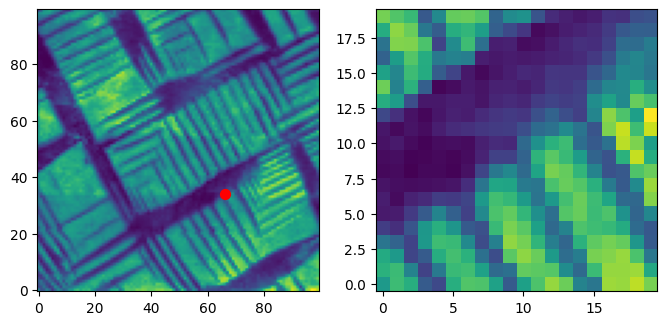

In [6]:
#normalize
norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
patch_image = norm_(amplitude) #normalize amplitude

# extract subimage for each point on a grid
coordinates = utils.get_coord_grid(patch_image, 1)   #grid

ws = 20  #patch window size
pix = int(len(patch_image)+1-ws)  #total pixel number

features_all, indices_all, _ = utils.extract_subimages(patch_image, coordinates, ws)
features_all = features_all[:,:,:,0]

# Show example patch and whole image
k = 2000  # index
_, (ax1, ax2) = plt.subplots(1,2, figsize = (8, 4))
ax1.imshow(patch_image, origin = 'lower')
ax1.scatter(indices_all[k, 1], indices_all[k, 0], c = 'r', s = 50)
ax2.imshow(features_all[k], origin = 'lower')

(-0.5, 99.5, -0.5, 99.5)

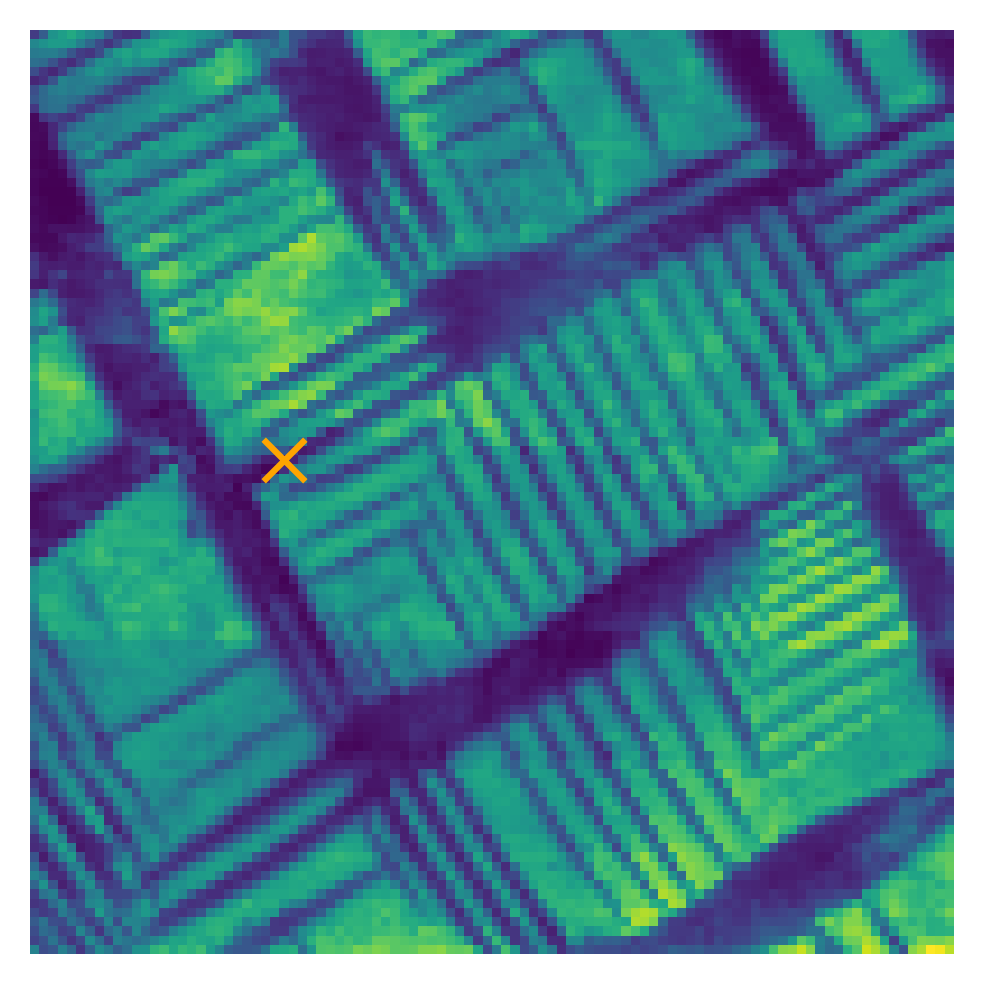

In [7]:
k1 = 3500; k2 = 5500  # index
_, ax1 = plt.subplots(figsize = (4, 4), dpi = 300)
ax1.imshow(patch_image, origin = 'lower')
ax1.scatter(indices_all[k1, 1], indices_all[k1, 0], c = 'orange', marker = "x", s = 100)
#ax1.scatter(indices_all[k2, 1], indices_all[k2, 0], c = 'orange', s = 50)
ax1.axis('off')

(-0.5, 19.5, -0.5, 19.5)

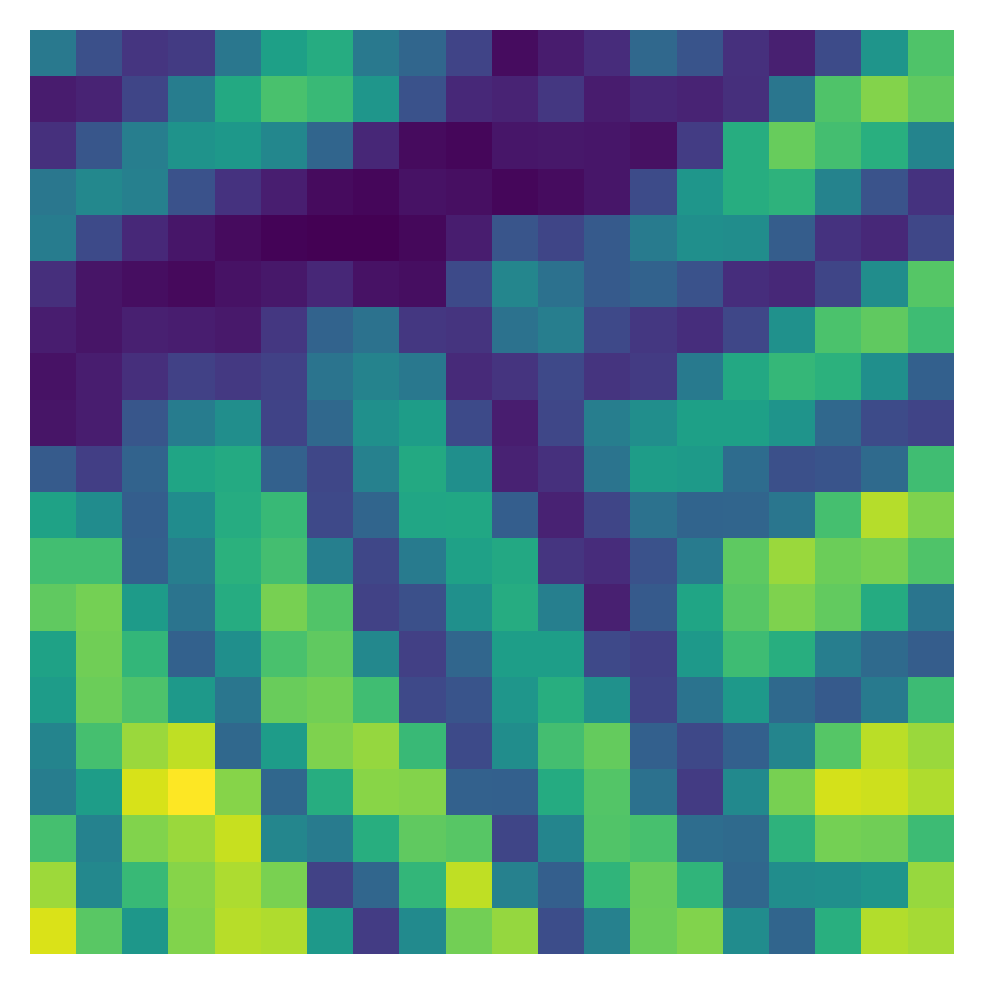

In [8]:
_, ax1 = plt.subplots(figsize = (4, 4), dpi = 300)
ax1.imshow(features_all[k2], origin = 'lower')
ax1.axis('off')


Text(0, 0.5, 'Piezoresponse (a.u.)')

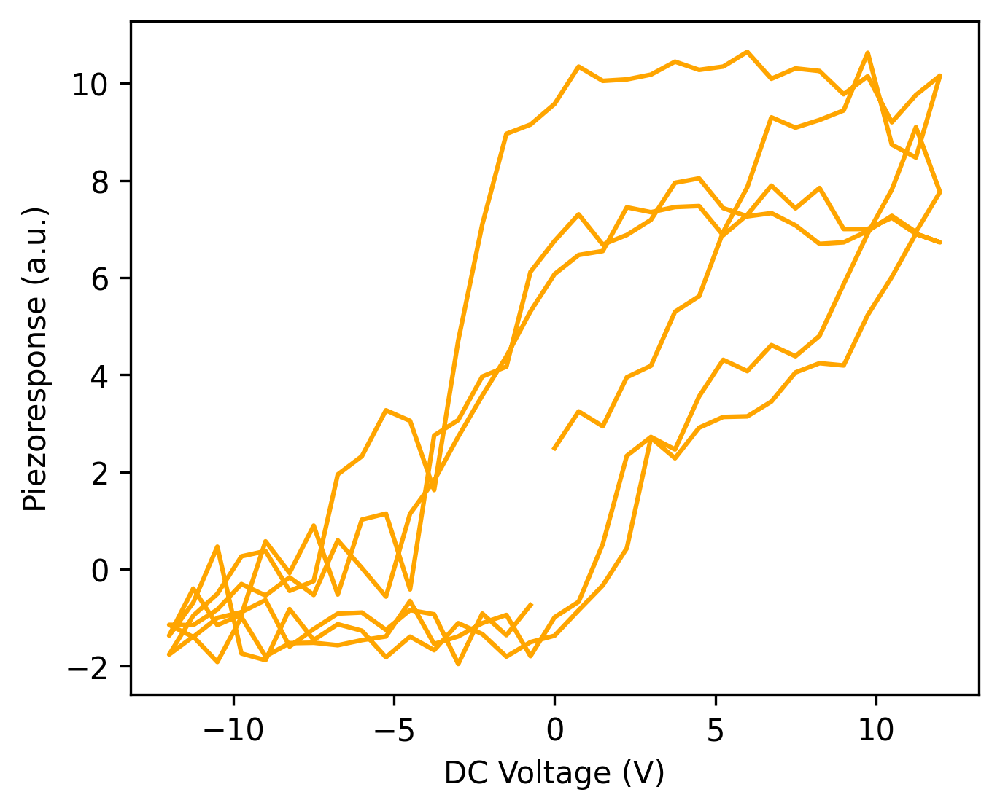

In [9]:
_,  ax2 = plt.subplots(figsize = (5, 4), dpi = 300)
ax2.plot(DC, spec[int(indices_all[k1, 0]), int(indices_all[k1, 1]),], c = 'orange')
#ax2.plot(DC, spec[int(indices_all[k2, 0]), int(indices_all[k2, 1]),], c = 'orange')
ax2.set_xlabel('DC Voltage (V)')
ax2.set_ylabel("Piezoresponse (a.u.)")

In [10]:
# Extract target scalarizers corresponding to patches
coercive_field = np.zeros(pix*pix)
loop_width = np.zeros(pix*pix)
loop_area_on = np.zeros(pix*pix)
loop_area_off = np.zeros(pix*pix)

for i in range (pix*pix):
    coercive_field [i] = Cf[int(indices_all[i,0]), int(indices_all[i,1])]   #coercive field
    loop_width [i] = width[int(indices_all[i,0]), int(indices_all[i,1])]    #loop width
    loop_area_on [i] = A_on[int(indices_all[i,0]), int(indices_all[i,1])]    #on field loop area
    loop_area_off [i] = A_off[int(indices_all[i,0]), int(indices_all[i,1])]  #off field loop area

Prepare train dataset

In [11]:
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)  #training input: image patches

y_targ = loop_area_off     #training output: off field loop area
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())

y = y_targ.reshape(-1)
X.shape, y.shape

((6561, 400), (6561,))

Train on full data

In [12]:
kernel = 'matern'

In [13]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
dklgp.fit(X, y, training_cycles=50, base_kernel = kernel)

/usr/local/lib/python3.10/dist-packages/linear_operator/utils/sparse.py:51: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  if nonzero_indices.storage():


Epoch 1/50 ... Training loss: 0.7739


/usr/local/lib/python3.10/dist-packages/linear_operator/utils/cholesky.py:40: NumericalWarning: A not p.d., added jitter of 1.0e-06 to the diagonal
  warnings.warn(


Epoch 10/50 ... Training loss: 0.7287
Epoch 20/50 ... Training loss: 0.6889
Epoch 30/50 ... Training loss: 0.6478
Epoch 40/50 ... Training loss: 0.6078
Epoch 50/50 ... Training loss: 0.5677


In [14]:
#@title Function for plotting DKL prediction and uncertainty
def plot_dkl_result (ground_truth, dkl_mean,
                     dkl_var, indices=None, ws=None,
                     scatter_location = False):
  '''
  Function plots DKL prediction and uncertainty.
  Setting scatter_location = True and providing indices_train
  and window_size enable plotting training data points in ground
  truth.
  '''
  clear_output(wait=True)
  fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (12, 4))

  cm = 'viridis'
  shrink = 0.7
  pix = int(math.sqrt(len(dkl_mean)))

  im1 = ax1.imshow(ground_truth.reshape(pix,pix), interpolation='nearest', origin = "lower", cmap=cm)
  fig.colorbar(im1, ax=ax1, shrink = shrink)
  if scatter_location == True:
    ax1.scatter(indices[:, 1]-int(ws/2), indices[:, 0]-int(ws/2), s=12,
                c = np.arange(len(indices)), cmap = 'bwr')
  ax1.set_title("Ground Truth")
  ax1.axis('off')

  im2 = ax2.imshow(dkl_mean.reshape(pix,pix), interpolation='nearest', origin = "lower", cmap=cm)
  fig.colorbar(im2, ax=ax2, shrink = shrink)
  ax2.set_title("DKL Prediction")
  ax2.axis('off')

  im3 = ax3.imshow(dkl_var.reshape(pix,pix), interpolation='nearest', origin = "lower", cmap=cm)
  fig.colorbar(im3, ax=ax3, shrink = shrink)
  ax3.set_title("DKL Uncertainty")
  ax3.axis('off')

  plt.show()
  plt.close(fig)

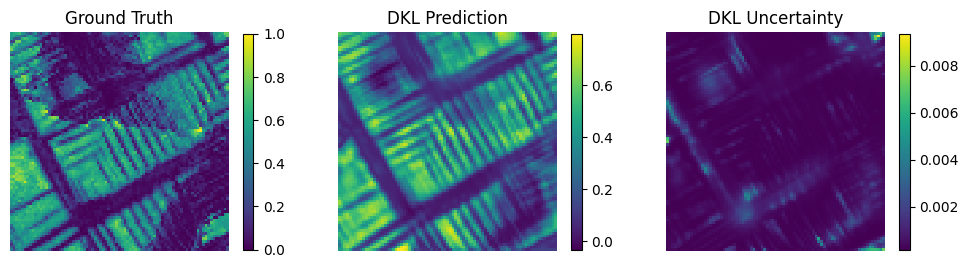

In [15]:
mean, var = dklgp.predict(X, batch_size=len(X))
plot_dkl_result(y, mean, var)

In [16]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

# cm = 'RdBu'
# shrink = 0.7

# im1 = ax1.imshow(embeded[:,0].reshape(pix, pix), interpolation='nearest', origin = "lower", cmap=cm)
# fig.colorbar(im1, ax=ax1, shrink = shrink)
# ax1.set_title("Embedded 1")
# ax1.axis('off')

# im2 = ax2.imshow(embeded[:,1].reshape(pix, pix), interpolation='nearest', origin = "lower", cmap=cm)
# fig.colorbar(im2, ax=ax2, shrink = shrink)
# ax2.set_title("Embedded 2")
# ax2.axis('off')

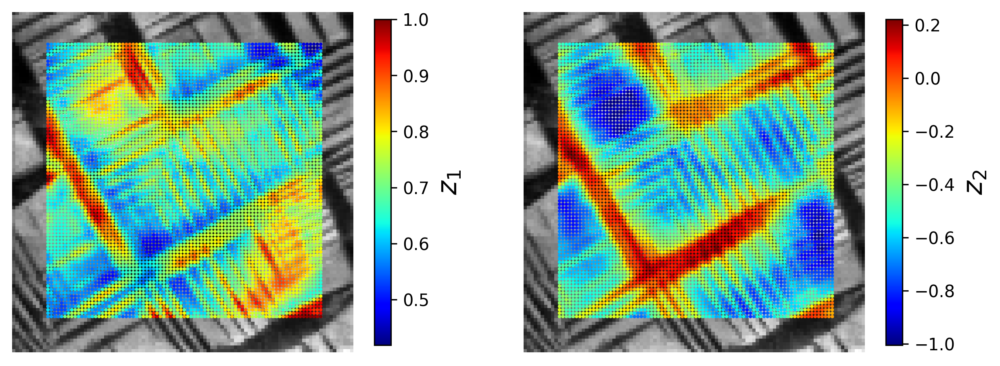

In [17]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), dpi = 300)
ax1.imshow(patch_image, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,0].reshape(pix, pix), cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(patch_image, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = embeded[:,1].reshape(pix, pix), cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)


# DKL BO experiment

In [18]:
#@title Define acquisition functions for BO:
from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, sigma = samples.mean(0), samples.var(0).sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def qEI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        best_f: Union[float, torch.Tensor], xi: float = 0.01,
        **kwargs: int) -> np.ndarray:
    """
    MC-based Expected Improvement
    """
    device = model.device
    dtype = model.dtype
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    obj = (obj - best_f.unsqueeze(-1).to(obj) - xi).clamp_min(0).detach().cpu()
    return obj.numpy()

def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, var = samples.mean(0), samples.var(0)
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()

def qUCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
         beta: float = 0.2, **kwargs: int) -> np.ndarray:
    """
    MC-based upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta_prime = math.sqrt(beta * math.pi / 2)
    posterior = model.gp_model.posterior(X.to(dtype).to(device))
    sampler = botorch.sampling.SobolQMCNormalSampler(500, kwargs.get("seed", 42))
    samples = sampler(posterior)
    objective = botorch.acquisition.IdentityMCObjective()
    obj = objective(samples)
    mean = obj.mean(dim=0)
    obj = mean + beta_prime * (obj - mean).abs()
    return obj.detach().cpu().numpy()

In [19]:
#@title Functions for plotting result, selecting next measurement point, and update train/test dataset
def sel_next_point (dklgp, X_train, X_test, xi):
  '''
  Function selects next_point_idx based on either EI
  acquision function (0) or maximum uncertainty point (1)
  '''
  global acq_idx
  if acq_idx == 0:  # 0 uses EI function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    next_point_idx = obj.mean(0).argmax()
  elif acq_idx == 1:  # 1 explores the max uncertainty point
    mean0, var0 = dklgp.predict(X_test, batch_size=len(X_test))
    next_point_idx = var0.argmax()
  elif acq_idx == 2:  # 2 uses UCB function
    obj = UCB(dklgp, X_test)
    next_point_idx = obj.mean(0).argmax()

  return next_point_idx

def update_train_test_data(X_train, X_test, y_train, y_test,
                           indices_train, indices_test,
                           next_point_idx, measured_point, next_point):
  X_train = np.append(X_train, X_test[next_point_idx][None], 0)
  X_test = np.delete(X_test, next_point_idx, 0)
  y_train = np.append(y_train, measured_point)
  y_test = np.delete(y_test, next_point_idx)
  indices_train = np.append(indices_train, next_point[None], 0)
  indices_test = np.delete(indices_test, next_point_idx, 0)

  return (X_train, X_test, y_train, y_test, indices_train, indices_test)

Initialize train, test dataset

Initialize DKL parameters

In [20]:
exploration_steps = 150

xi = 0.01  # balances exploration and explitation for EI and qEI
cm = 'viridis'
shrink = 0.7

# *Please select different acquistion function and run multiple time step 1-4*

In [21]:
# determine acquition funciton,
acq = 3  # 0 uses EI, 1 explores max uncertainty point, 2 uses UCB

rf = '/content/rf/'   #root folder
if not os.path.exists(rf):
    os.mkdir(rf)

acq_funcs = ['EI', 'MU', 'UCB']   #list corresponds to Func sel_next_point.
# root_folderEI = rf+"EI/"
# root_folderMU = rf+"MU/"
# root_folderUCB = rf+"UCB/"

if acq == 3:             # when acq = 3, run all acq_funcs
  if not os.path.exists(rf + acq_funcs[0]):
    os.mkdir(rf + acq_funcs[0])
  if not os.path.exists(rf + acq_funcs[1]):
    os.mkdir(rf + acq_funcs[1])
  if not os.path.exists(rf + acq_funcs[2]):
    os.mkdir(rf + acq_funcs[2])
elif acq < 3:
  if not os.path.exists(rf + acq_funcs[acq]):  # change root folder name when you change acquistion funciton
    os.mkdir(rf + acq_funcs[acq])

## Step 1. DKL exploration based on target property of hysteresis loop area



*   This exploration process uses either EI acquition function or maximum uncertainty location
*   During the exploration, DKL will determine 200 measurement locations. Then, these locations will be used in later analysis processes with different target properties.



In [22]:
ts = 0.9995  #test data size
rs = 5   #random state determines initial train data
dklkernel = 'matern'  #kernel for DKL analysis

In [23]:
#@title define a function to run DKL exploration
def dkl_explore (save_explore):
  global X, y, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Here X_train and y_train are our measured image patches and spectra information,
  # whereas X_test and y_test are the "unkwown" ones. The indices_train are grid coordinates of the measured points,
  # whereas the indices_test are the grid coordinates of the remaining available points on the grid
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  if not os.path.exists(rf + acq_funcs[acq_idx] + save_explore):
    os.mkdir(rf + acq_funcs[acq_idx] + save_explore)
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, y_train = y_train,
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, base_kernel=dklkernel)

    mean, var = dklgp.predict(X, batch_size=len(X))
    plot_dkl_result(y, mean, var, indices=indices_train,
                    ws = ws, scatter_location = True)

    # Compute acquisition function
    next_point_idx = sel_next_point (dklgp, X_train, X_test, xi)
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

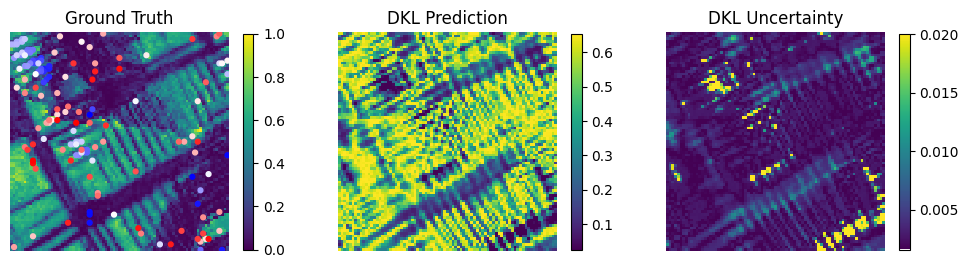

In [24]:
save_explore =  "/explore_dkl_record/"

# run DKL exploration with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_explore(save_explore)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_explore(save_explore)

## Now, DKL experiment based on hysteresis loop area is done. Next, the exploration locations will be used for other analyses with different target properties, e.g., hysteresis loop width, coercive field, etc. We will check the evolution of DKL results of other target properties.


## Step 2-1

First, DKL analysis of hysteresis loop width. Note that here the y_train is hysteresis loop width, and the training data points are from the DKL exploration in Step 1.

In [25]:
#@title define a function to run dkl counterfactual with different scalarizer
def dkl_counterfactual(y, save_counter):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_counter):
    os.mkdir(rf + acq_funcs[acq_idx] + save_counter)

  # Save initial train data
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, lr = 0.01)

    mean, var = dklgp.predict(X, batch_size=len(X))
    plot_dkl_result(y, mean, var, indices=indices_train,
                    ws = ws, scatter_location = True)

    # Load measurement locations from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_counter)
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_counter)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)


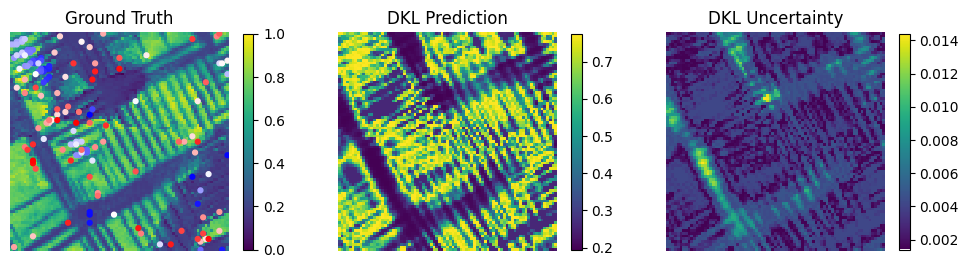

In [26]:
# Set hysteresis loop width as target property
y_targ = loop_width     #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_counter1 = "/counter_loopwidth_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_counterfactual(y, save_counter1)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_counterfactual(y, save_counter1)

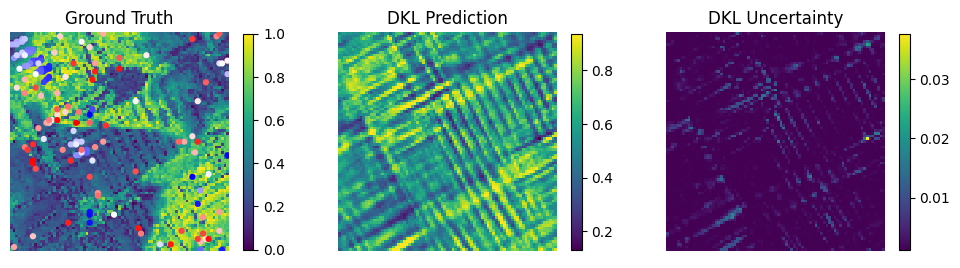

In [27]:
# Set coercive field as target property
y_targ = coercive_field    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_counter2 = "/counter_coercivefield_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_counterfactual(y, save_counter2)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_counterfactual(y, save_counter2)

## Step 3: DKL analysis based on random location. As a reference for the DKL analysis based on prior exploration locations from Step 1, next, we do DKL analyses based on random location with target properties, e.g. loop width, coercive field, on field hysteresis loop area.

Step 3-1: DKL analysis based on random location with target property of hysteresis loop width. Here the train data points are from random location.

In [28]:
#@title define a function to run dkl analysis with random sampling
def dkl_random(y, save_random):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws
  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_random):
    os.mkdir(rf + acq_funcs[acq_idx] + save_random)

  # Save initial train data
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, base_kernel=dklkernel)

    mean, var = dklgp.predict(X, batch_size=len(X))
    plot_dkl_result(y, mean, var, indices=indices_train,
                    ws = ws, scatter_location = True)

    # Load measurement locations from Step 1
    next_point_idx = np.random.randint(len(X_test))
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_random)
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)

  # Save final traindata
  os.chdir(rf + acq_funcs[acq_idx] + save_random)
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

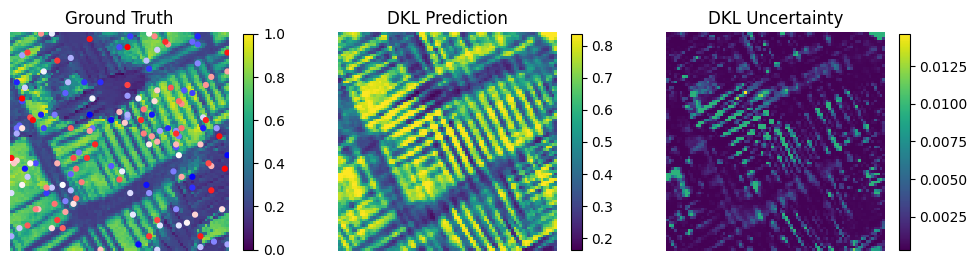

In [29]:
# Set hysteresis loop width as target property
y_targ = loop_width     #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random1 = "/random_loopwidth_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random1)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random1)

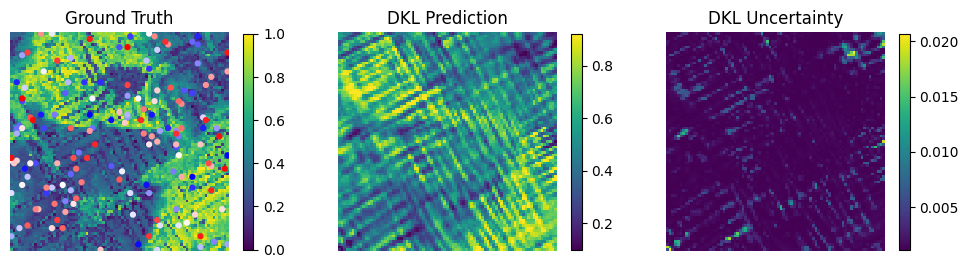

In [30]:
# Set coercive field as target property
y_targ = coercive_field    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_random2 = "/random_coercivefield_record/"

# run DKL counterfactual with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_random(y, save_random2)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_random(y, save_random2)

## Step 4: Compare the performance of matured DKL (i.e. the DKL model at the end of exploration--at 200 step in this work) and real time DKL model.

In [31]:
#@title define a function to run dkl counterfactual with different scalarizer
def dkl_mature_full(y, save_mature_full):
  global X, indices_all, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws

  # Load last step train dataset
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  rec = np.load("final_traindata.npz")
  X_train = rec["X_train"]
  y_train = rec["y_train"]

  # Train a matured DKL model with the last step train dataset
  # dklgp0 will be the matured DKL model
  dklgp0 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp0.fit(X_train, y_train, training_cycles=200, base_kernel=dklkernel)

  # Train a full-informed DKL model with all data
  # dklgp1 will be the full-informed DKL model
  dklgp1 = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
  dklgp1.fit(X, y, training_cycles=200, base_kernel=dklkernel)

  # Initialize train/test datasets
  (X_train, X_test, y_train, y_test,
   indices_train, indices_test) = train_test_split(
       X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)

  # Set path for saving result
  if not os.path.exists(rf + acq_funcs[acq_idx] + save_mature_full):
    os.mkdir(rf + acq_funcs[acq_idx] + save_mature_full)

  # Start DKL analysis
  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    #update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=200, lr = 0.01)

    mean, var = dklgp.predict(X_test, batch_size=len(X_test))  #real-time DKL model
    mean0, var0 = dklgp0.predict(X_test, batch_size=len(X_test)) #matured DKL model
    mean1, var1 = dklgp1.predict(X_test, batch_size=len(X_test)) #full-informed DKL model

    # Load measurement location from Step 1
    os.chdir(rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(e))
    next_point_idx = rec['next_point_idx']
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]

        # Save result
    os.chdir(rf + acq_funcs[acq_idx] + save_mature_full)
    np.savez("record{}.npz".format(e), y_test = y_test,
             mean = mean, var = var,
             mean0 = mean0, var0 = var0,
             mean1 = mean1, var1 = var1)

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point = next_point)
    clear_output(wait=True)


In [32]:
# Set loop area as target property
y_targ = loop_area_off    #training output;
y_targ = (y_targ-y_targ.min())/(y_targ.max()-y_targ.min())
y = y_targ.reshape(-1)

save_mature_full = "/mature_full_record/"

# run real-time DKL, mature DKL, and full DKL with different acquisition functions
if acq < 3:   # if user select an individual acquistion function
  acq_idx = acq
  dkl_mature_full(y, save_mature_full)

elif acq == 3:  # if user selected to run all acquistion functions
  for i in range (3):
    acq_idx = i
    dkl_mature_full(y, save_mature_full)

150/150
Epoch 1/200 ... Training loss: 0.8081
Epoch 10/200 ... Training loss: 0.7724
Epoch 20/200 ... Training loss: 0.7371
Epoch 30/200 ... Training loss: 0.702
Epoch 40/200 ... Training loss: 0.6664
Epoch 50/200 ... Training loss: 0.6303
Epoch 60/200 ... Training loss: 0.5928
Epoch 70/200 ... Training loss: 0.5534
Epoch 80/200 ... Training loss: 0.5119
Epoch 90/200 ... Training loss: 0.4662
Epoch 100/200 ... Training loss: 0.4104
Epoch 110/200 ... Training loss: 0.349
Epoch 120/200 ... Training loss: 0.2937
Epoch 130/200 ... Training loss: 0.2417
Epoch 140/200 ... Training loss: 0.2086
Epoch 150/200 ... Training loss: 0.1432
Epoch 160/200 ... Training loss: 0.0905
Epoch 170/200 ... Training loss: 0.0384
Epoch 180/200 ... Training loss: -0.0133
Epoch 190/200 ... Training loss: -0.0654
Epoch 200/200 ... Training loss: -0.1175


/usr/local/lib/python3.10/dist-packages/gpytorch/distributions/multivariate_normal.py:319: NumericalWarning: Negative variance values detected. This is likely due to numerical instabilities. Rounding negative variances up to 1e-06.
  warnings.warn(


## Zip and download all results


In [33]:
!zip -r /content/BEPSws8.zip /content/rf   #zip the root folder

from google.colab import files
files.download("/content/BEPSws8.zip")  #download to local

  adding: content/rf/ (stored 0%)
  adding: content/rf/MU/ (stored 0%)
  adding: content/rf/MU/mature_full_record/ (stored 0%)
  adding: content/rf/MU/mature_full_record/record73.npz (deflated 16%)
  adding: content/rf/MU/mature_full_record/record12.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record128.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record135.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record84.npz (deflated 16%)
  adding: content/rf/MU/mature_full_record/record94.npz (deflated 16%)
  adding: content/rf/MU/mature_full_record/record131.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record72.npz (deflated 16%)
  adding: content/rf/MU/mature_full_record/record144.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record15.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record80.npz (deflated 15%)
  adding: content/rf/MU/mature_full_record/record89.npz (deflated 16%)
  adding: content

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



# Step 5. Analysis

In [34]:
!pip install --upgrade git+https://github.com/ziatdinovmax/pyroved.git

  Cloning https://github.com/ziatdinovmax/pyroved.git to /tmp/pip-req-build-s61m5h9r
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/pyroved.git /tmp/pip-req-build-s61m5h9r
  Resolved https://github.com/ziatdinovmax/pyroved.git to commit f842ebf0205b79d4c8b791defe0546bd24c1c4aa
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 732.8/732.8 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.9/37.9 MB 38.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyroved: filename=pyroved-0.2.3-py3-none-any.whl size=48265 sha256=03471191f435d63f8cc93da04a0fbe604eab09c1798ec0f3741926f2cd062537
  Stored in directory: /tmp/pip-ephem-wheel-cache-hhpkbg7s/wheels/16/b8/27/0fe349f9d2ed1b453affc74e27238f90834b88ab4dda5734da
  Created wheel for matplotlib: filename=matplotlib-3.3.4-cp310-cp310-linux_x86_64.whl size=11684757 sha256=50abd0c7fed3d75f8749564344359796d4234f5a3d3887a99d7b

In [87]:
# rf = '/content/rf/'   #root folder
# save_explore =  "/explore_dkl_record/"
# save_counter1 = "/counter_loopwidth_record/"
# save_counter2 = "/counter_coercivefield_record/"
# save_random1 = "/random_loopwidth_record/"
# save_random2 = "/random_coercivefield_record/"
# save_mature_full = "/mature_full_record/"

# !gdown https://drive.google.com/uc?id=1jtp9_T8K6sXqqdqMbIOr29eD1slaCIeu

# !unzip rf.zip

In [36]:
import glob
from scipy import ndimage
import matplotlib.gridspec as gridspec
import pyroved as pv
import numpy as np
import matplotlib.pyplot as plt
import cv2
from atomai.utils import extract_patches_
import glob
from torch.autograd import Variable
import atomai as aoi

import torch
import torch.nn as nn
import torch.nn.functional as F

from copy import deepcopy as dc

import h5py

from scipy import ndimage
from sklearn import decomposition

import matplotlib as mpl

import os
from atomai import utils

## Step 5-1 Plot DKL results

Load results of real-time DKL, trained DKL, and Full-DKL

In [38]:
# Create array to save results of real time and matured DKL models
# save results from EI acuqisition funciton

exploration_steps = 150

var_compare = np.empty((3, 3, exploration_steps))  # uncertainty
var_dev_compare = np.empty((3, 3, exploration_steps)) # uncertainty variation
nextpoint_uncertainty_compare = np.empty((3, 3, exploration_steps)) # predicted next point uncertainty
nextpoint_measure_compare = np.empty((3, 3, exploration_steps)) # next point ground truth
nextpoint_pred_compare = np.empty((3, 3, exploration_steps)) # next point prediction

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results of DKL
    rec = np.load("record{}.npz".format(i))
    var_compare[acq_idx, :, i] = rec['var'].mean(), rec['var0'].mean(), rec['var1'].mean()
    var_dev_compare[acq_idx, :, i] = np.std(rec['var']), np.std(rec['var0']), np.std(rec['var1'])
    nextpoint_uncertainty_compare[acq_idx, :, i] = rec['var'].max(), rec['var0'].max(), rec['var1'].max()
    nextpoint_measure_compare[acq_idx, :, i] = rec['y_test'][rec['var'].argmax()], rec['y_test'][rec['var0'].argmax()], rec['y_test'][rec['var1'].argmax()]
    nextpoint_pred_compare[acq_idx, :, i] = rec['mean'][rec['var'].argmax()], rec['mean0'][rec['var0'].argmax()], rec['mean1'][rec['var1'].argmax()]

Plot uncertainty (of each model) as a function of step

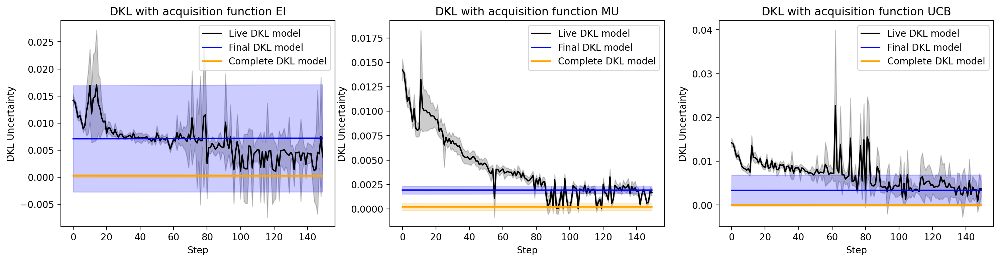

In [39]:
s = np.arange(exploration_steps) #step

fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize = (18, 4), dpi = 200)

#Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, var_compare[0, 0,], c= 'black', label = "Live DKL model")
ax1.fill_between(s, var_compare[0, 0,]-var_dev_compare[0, 0,],
                 var_compare[0, 0,]+var_dev_compare[0, 0,], color='black', alpha=0.2)
ax1.plot(s, var_compare[0, 1,], c = 'blue', label = "Final DKL model")
ax1.fill_between(s, var_compare[0, 1,]-var_dev_compare[0, 1,],
                 var_compare[0, 1,]+var_dev_compare[0, 1,],  color='blue', alpha=0.2)
ax1.plot(s, var_compare[0, 2,], c = 'orange', label = "Complete DKL model")
ax1.fill_between(s, var_compare[0, 2,]-var_dev_compare[0, 2,],
                 var_compare[0, 2,]+var_dev_compare[0, 2,], color='orange', alpha=0.2)
ax1.set_ylabel("DKL Uncertainty")
ax1.set_xlabel('Step')
ax1.legend()

#Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, var_compare[1, 0,], c= 'black', label = "Live DKL model")
ax2.fill_between(s, var_compare[1, 0,]-var_dev_compare[1, 0,],
                 var_compare[1, 0,]+var_dev_compare[1, 0,], color='black', alpha=0.2)
ax2.plot(s, var_compare[1, 1,], c = 'blue', label = "Final DKL model")
ax2.fill_between(s, var_compare[1, 1,]-var_dev_compare[1, 1,],
                 var_compare[1, 1,]+var_dev_compare[1, 1,],  color='blue', alpha=0.2)
ax2.plot(s, var_compare[1, 2,], c = 'orange', label = "Complete DKL model")
ax2.fill_between(s, var_compare[1, 2,]-var_dev_compare[1, 2,],
                 var_compare[1, 2,]+var_dev_compare[1, 2,], color='orange', alpha=0.2)
ax2.set_ylabel("DKL Uncertainty")
ax2.set_xlabel('Step')
ax2.legend()

#Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, var_compare[2, 0,], c= 'black', label = "Live DKL model")
ax3.fill_between(s, var_compare[2, 0,]-var_dev_compare[2, 0,],
                 var_compare[2, 0,]+var_dev_compare[2, 0,], color='black', alpha=0.2)
ax3.plot(s, var_compare[2, 1,], c = 'blue', label = "Final DKL model")
ax3.fill_between(s, var_compare[2, 1,]-var_dev_compare[2, 1,],
                 var_compare[2, 1,]+var_dev_compare[2, 1,],  color='blue', alpha=0.2)
ax3.plot(s, var_compare[2, 2,], c = 'orange', label = "Complete DKL model")
ax3.fill_between(s, var_compare[2, 2,]-var_dev_compare[2, 2,],
                 var_compare[2, 2,]+var_dev_compare[2, 2,], color='orange', alpha=0.2)
ax3.set_ylabel("DKL Uncertainty")
ax3.set_xlabel('Step')
ax3.legend()

plt.show()

Plot the maximum uncertainty point from each model as a funciton of step. For now, the next point uncertainty is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

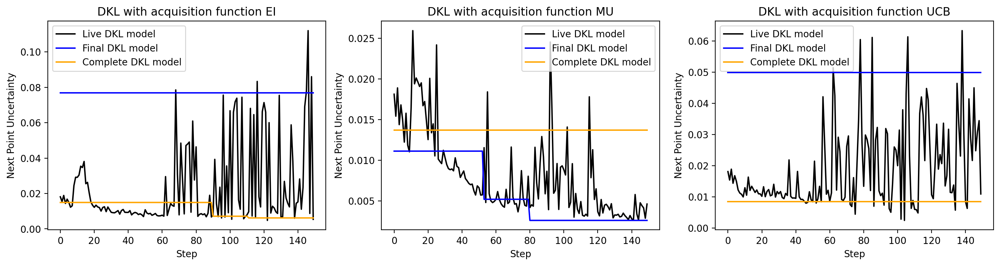

In [40]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_uncertainty_compare[0, 0,], c= 'black', label = "Live DKL model")
ax1.plot(s, nextpoint_uncertainty_compare[0, 1,], c = 'blue', label = "Final DKL model")
ax1.plot(s, nextpoint_uncertainty_compare[0, 2,], c = 'orange', label = "Complete DKL model")
ax1.set_ylabel("Next Point Uncertainty"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_uncertainty_compare[1, 0,], c= 'black', label = "Live DKL model")
ax2.plot(s, nextpoint_uncertainty_compare[1, 1,], c = 'blue', label = "Final DKL model")
ax2.plot(s, nextpoint_uncertainty_compare[1, 2,], c = 'orange', label = "Complete DKL model")
ax2.set_ylabel("Next Point Uncertainty"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_uncertainty_compare[2, 0,], c= 'black', label = "Live DKL model")
ax3.plot(s, nextpoint_uncertainty_compare[2, 1,], c = 'blue', label = "Final DKL model")
ax3.plot(s, nextpoint_uncertainty_compare[2, 2,], c = 'orange', label = "Complete DKL model")
ax3.set_ylabel("Next Point Uncertainty"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Plot next point ground truth (ie. next measurement value)  from each model as a funciton of step. For now, the next point is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

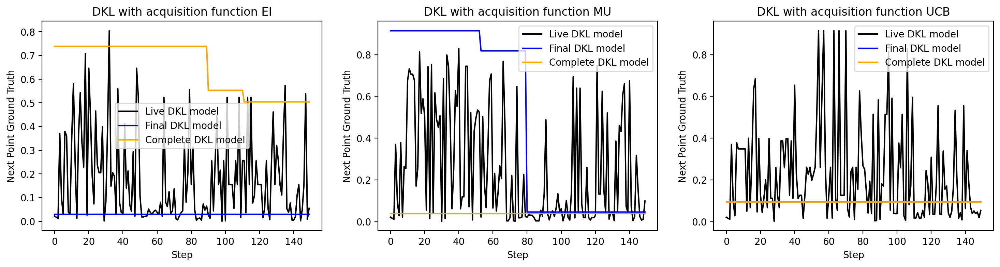

In [41]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_measure_compare[0, 0,], c= 'black', label = "Live DKL model")
ax1.plot(s, nextpoint_measure_compare[0, 1,], c = 'blue', label = "Final DKL model")
ax1.plot(s, nextpoint_measure_compare[0, 2,], c = 'orange', label = "Complete DKL model")
ax1.set_ylabel("Next Point Ground Truth"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_measure_compare[1, 0,], c= 'black', label = "Live DKL model")
ax2.plot(s, nextpoint_measure_compare[1, 1,], c = 'blue', label = "Final DKL model")
ax2.plot(s, nextpoint_measure_compare[1, 2,], c = 'orange', label = "Complete DKL model")
ax2.set_ylabel("Next Point Ground Truth"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_measure_compare[2, 0,], c= 'black', label = "Live DKL model")
ax3.plot(s, nextpoint_measure_compare[2, 1,], c = 'blue', label = "Final DKL model")
ax3.plot(s, nextpoint_measure_compare[2, 2,], c = 'orange', label = "Complete DKL model")
ax3.set_ylabel("Next Point Ground Truth"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Plot next point prediciton from each model as a funciton of step. For now, the next point is simply defined as maximum uncertainty (needs some thinkings!--may need to use EI or UCB function;; or next point from experiment)

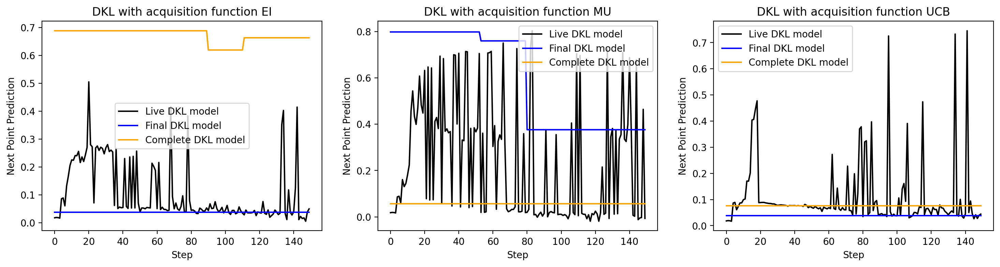

In [42]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (18, 4), dpi = 200)

# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, nextpoint_pred_compare[0, 0,], c= 'black', label = "Live DKL model")
ax1.plot(s, nextpoint_pred_compare[0, 1,], c = 'blue', label = "Final DKL model")
ax1.plot(s, nextpoint_pred_compare[0, 2,], c = 'orange', label = "Complete DKL model")
ax1.set_ylabel("Next Point Prediction"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, nextpoint_pred_compare[1, 0,], c= 'black', label = "Live DKL model")
ax2.plot(s, nextpoint_pred_compare[1, 1,], c = 'blue', label = "Final DKL model")
ax2.plot(s, nextpoint_pred_compare[1, 2,], c = 'orange', label = "Complete DKL model")
ax2.set_ylabel("Next Point Prediction"); ax2.set_xlabel('Step'); ax2.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, nextpoint_pred_compare[2, 0,], c= 'black', label = "Live DKL model")
ax3.plot(s, nextpoint_pred_compare[2, 1,], c = 'blue', label = "Final DKL model")
ax3.plot(s, nextpoint_pred_compare[2, 2,], c = 'orange', label = "Complete DKL model")
ax3.set_ylabel("Next Point Prediction"); ax3.set_xlabel('Step'); ax3.legend()

plt.show()

Calculate regret: here I define regret as the difference between real-time DKL prediciton (mean) and trained DKL prediction (mean).



In [43]:
# Create array to save results of real time and matured DKL models
# save results from three acuqisition funciton
reg = np.empty((3, 2, exploration_steps))  # save the difference of predictions between real time DKL and trained DKL at each step; as well as deviation

for acq_idx in range (3):
  os.chdir (rf + acq_funcs[acq_idx] + save_mature_full)
  for i in range (exploration_steps):
    # load results
    rec = np.load("record{}.npz".format(i))
    mean_d = rec['mean']-rec['mean0']
    reg[acq_idx,:,i] = mean_d.mean(), np.std(mean_d)


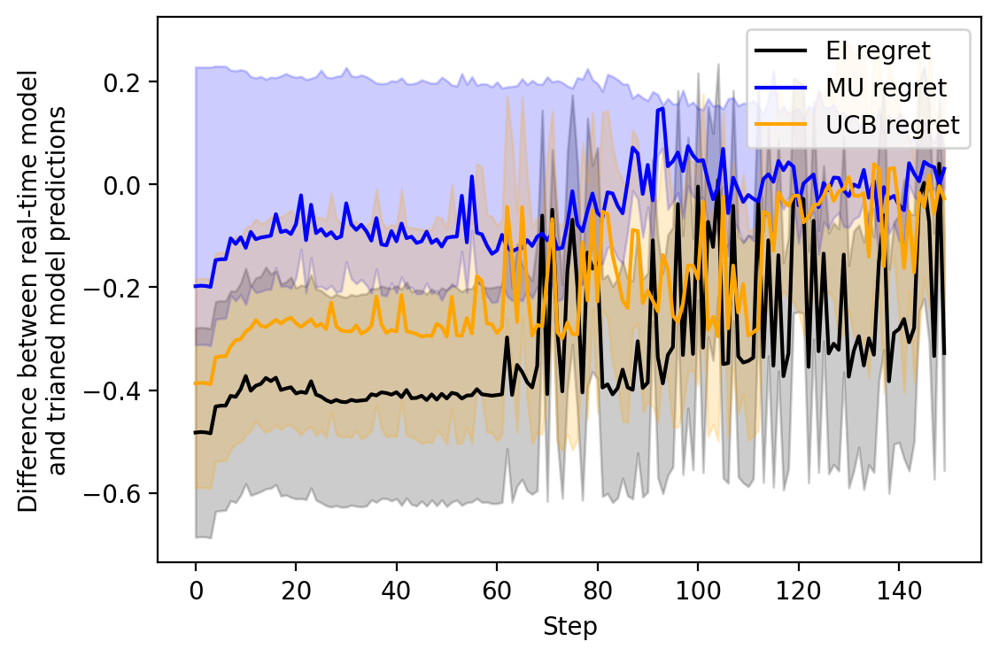

In [44]:
fig, ax = plt.subplots(figsize = (6, 4), dpi = 200)

ax.plot(s, reg[0,0,], c= 'black', label = "EI regret")
ax.fill_between(s, reg[0,0,]-reg[0,1,], reg[0,0,]+reg[0,1,],
                color='black', alpha=0.2)

ax.plot(s, reg[1,0,], c= 'blue', label = "MU regret")
ax.fill_between(s, reg[1,0,]-reg[1,1,], reg[1,1,]+reg[1,1,],
                color='blue', alpha=0.2)

ax.plot(s, reg[2,0,], c= 'orange', label = "UCB regret")
ax.fill_between(s, reg[2,0,]-reg[2,1,], reg[2,0,]+reg[2,1,],
                color='orange', alpha=0.2)

ax.set_ylabel("Difference between real-time model\nand trianed model predictions")
ax.set_xlabel('Step')
plt.legend()
plt.show()

Structure similarity index between ground truth and prediciton

In [45]:
sim = np.zeros((3, 5, exploration_steps)) # structural similarity index
from skimage.metrics import structural_similarity as ssim

for acq_idx in range (3):
  for i in range (exploration_steps):
    os.chdir (rf + acq_funcs[acq_idx] + save_explore)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(loop_area_off)  # ground truth
    sim[acq_idx, 0, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Loop width DKL analysis based on locations from Step1
    os.chdir (rf + acq_funcs[acq_idx] + save_counter1)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(loop_width)  # ground truth
    sim[acq_idx, 1, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Coercive field DKL analysis based on locations from Step1
    os.chdir (rf + acq_funcs[acq_idx] + save_counter2)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(coercive_field)  # ground truth
    sim[acq_idx, 2, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # Loop width DKL analysis based on random locations
    os.chdir (rf + acq_funcs[acq_idx] + save_random1)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(loop_width)  # ground truth
    sim[acq_idx, 3, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

    # COercive field DKL analysis based on random locations
    os.chdir (rf + acq_funcs[acq_idx] + save_random2)
    rec = np.load("record{}.npz".format(i))
    pm = norm_(rec ['mean']) # DKL prediction
    gt = norm_(coercive_field)  # ground truth
    sim[acq_idx, 4, i]=ssim(gt, pm, data_range=gt.max() - gt.min())  # calculate SSIM

<ipython-input-6-156f21331f05>:2: RuntimeWarning: invalid value encountered in true_divide
  norm_ = lambda x: (x - x.min()) / (x.max() - x.min())


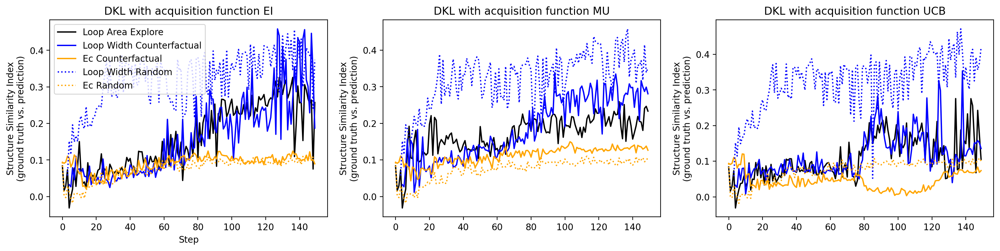

In [46]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (19, 4), dpi = 200)

s = np.arange(exploration_steps)
# Plot EI
ax1.set_title("DKL with acquisition function EI")
ax1.plot(s, sim[0, 0,], c= 'black', label = "Loop Area Explore")
ax1.plot(s, sim[0, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax1.plot(s, sim[0, 2,], c = 'orange', label = "Ec Counterfactual")
ax1.plot(s, sim[0, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax1.plot(s, sim[0, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax1.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

# Plot MU
ax2.set_title("DKL with acquisition function MU")
ax2.plot(s, sim[1, 0,], c= 'black', label = "Loop Area Explore")
ax2.plot(s, sim[1, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax2.plot(s, sim[1, 2,], c = 'orange', label = "Ec Counterfactual")
ax2.plot(s, sim[1, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax2.plot(s, sim[1, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax2.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

# Plot UCB
ax3.set_title("DKL with acquisition function UCB")
ax3.plot(s, sim[2, 0,], c= 'black', label = "Loop Area Explore")
ax3.plot(s, sim[2, 1,], c = 'blue', label = "Loop Width Counterfactual")
ax3.plot(s, sim[2, 2,], c = 'orange', label = "Ec Counterfactual")
ax3.plot(s, sim[2, 3,], c = 'blue', linestyle = ":", label = "Loop Width Random")
ax3.plot(s, sim[2, 4,], c = 'orange', linestyle = ":", label = "Ec Random")
ax3.set_ylabel("Structure Similarity Index\n(ground truth vs. prediction)"); ax1.set_xlabel('Step'); ax1.legend()

plt.show()

In [47]:
traj_EI = np.zeros((exploration_steps, 2))
traj_MU = np.zeros((exploration_steps, 2))
traj_UCB = np.zeros((exploration_steps, 2))

for i in range (exploration_steps):
  os.chdir (rf + acq_funcs[0] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_EI [i, ] = nextpoint

  os.chdir (rf + acq_funcs[1] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_MU [i, ] = nextpoint

  os.chdir (rf + acq_funcs[2] + save_explore)
  rec = np.load("record{}.npz".format(i))
  nextpoint = rec ['next_point']
  traj_UCB [i, ] = nextpoint

(-0.5, 99.5, -0.5, 99.5)

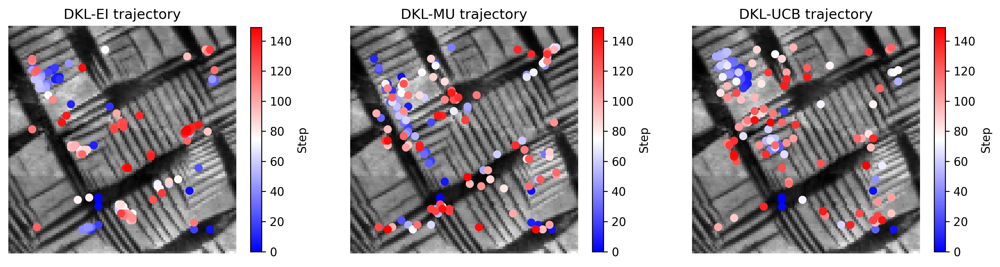

In [48]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)

cm = 'gray'
shrink = 0.7

ax1.imshow(patch_image, interpolation='nearest', origin = "lower", cmap=cm)
im1 = ax1.scatter(traj_EI[:,1], traj_EI[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im1, ax=ax1, shrink = shrink, label = "Step")
ax1.set_title("DKL-EI trajectory")
ax1.axis('off')

ax2.imshow(patch_image, interpolation='nearest', origin = "lower", cmap=cm)
im2 = ax2.scatter(traj_MU[:,1], traj_MU[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im2, ax=ax2, shrink = shrink, label = "Step")
ax2.set_title("DKL-MU trajectory")
ax2.axis('off')

ax3.imshow(patch_image, interpolation='nearest', origin = "lower", cmap=cm)
im3 = ax3.scatter(traj_UCB[:,1], traj_UCB[:,0], c = np.arange(exploration_steps), cmap = 'bwr')
fig.colorbar(im3, ax=ax3, shrink = shrink, label = "Step")
ax3.set_title("DKL-UCB trajectory")
ax3.axis('off')

## Step 5-2. rVAE analysis on DKL sampled data

EI sampled data

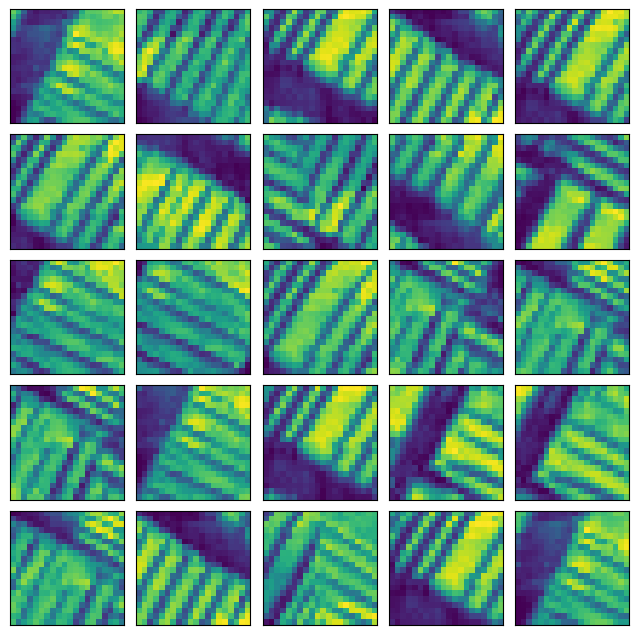

In [61]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[0] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_EI_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_EI_loader = pv.utils.init_dataloader(vae_EI_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_EI_data))
    ax.imshow(vae_EI_data[i].cpu(), interpolation='nearest')

In [62]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_EI = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)

# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_EI)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_EI_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 108206.2273
Epoch: 2 Training loss: 81358.0773
Epoch: 3 Training loss: 76877.1921
Epoch: 4 Training loss: 73088.2624
Epoch: 5 Training loss: 74744.0009
Epoch: 6 Training loss: 72610.0929
Epoch: 7 Training loss: 69048.4048
Epoch: 8 Training loss: 66392.8796
Epoch: 9 Training loss: 65095.6561
Epoch: 10 Training loss: 64034.0443
Epoch: 11 Training loss: 62231.2960
Epoch: 12 Training loss: 61551.8164
Epoch: 13 Training loss: 60095.9515
Epoch: 14 Training loss: 58727.5858
Epoch: 15 Training loss: 57698.8746
Epoch: 16 Training loss: 57668.9538
Epoch: 17 Training loss: 56351.5972
Epoch: 18 Training loss: 56028.3973
Epoch: 19 Training loss: 55071.6414
Epoch: 20 Training loss: 54809.8559
Epoch: 21 Training loss: 54405.2234
Epoch: 22 Training loss: 55030.0422
Epoch: 23 Training loss: 55291.3956
Epoch: 24 Training loss: 53638.1096
Epoch: 25 Training loss: 53213.6788
Epoch: 26 Training loss: 53134.6240
Epoch: 27 Training loss: 52695.6540
Epoch: 28 Training loss: 52164.2605


Text(0.5, 1.0, 'DKL-EI trajectory')

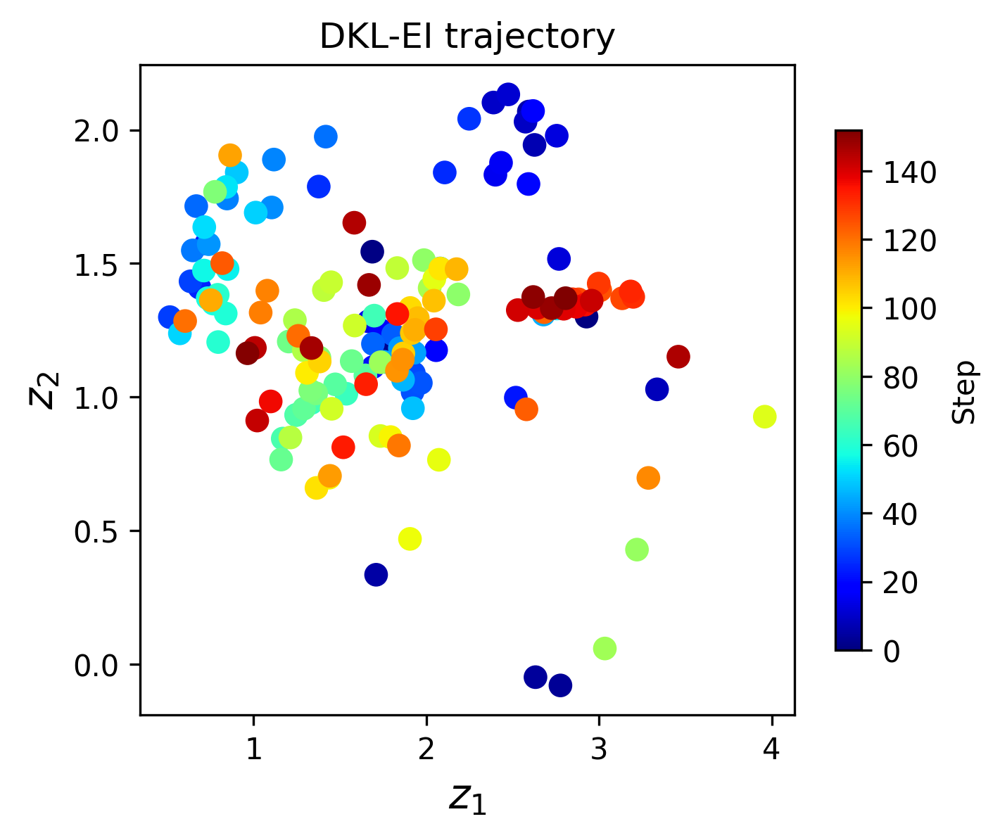

In [80]:
z_mean_EI, z_sd_EI = rvae_EI.encode(vae_EI_data)

plt.figure(figsize=(5, 4), dpi = 300)
plt.scatter(z_mean_EI[:, -2], z_mean_EI[:, -1], s=50, c = np.arange(len(vae_EI_data)), cmap = 'jet')
plt.xlabel("$z_1$", fontsize=14)
plt.ylabel("$z_2$", fontsize=14)
plt.colorbar(label = 'Step', shrink = 0.8)
plt.title("DKL-EI trajectory")
# plt.ylim (-2.5, 1.5)
# plt.xlim (0, 4.0)

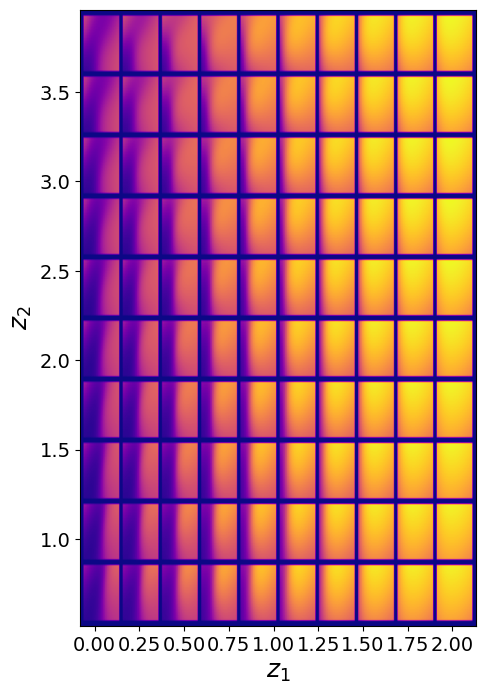

In [64]:
rvae_EI.manifold2d(10,
                   z_coord = [z_mean_EI[:, -1].min(), z_mean_EI[:, -1].max(), z_mean_EI[:, -2].min(), z_mean_EI[:, -2].max()],
                   cmap = 'plasma', dpi = 300);

Maximum uncertainty sampled data

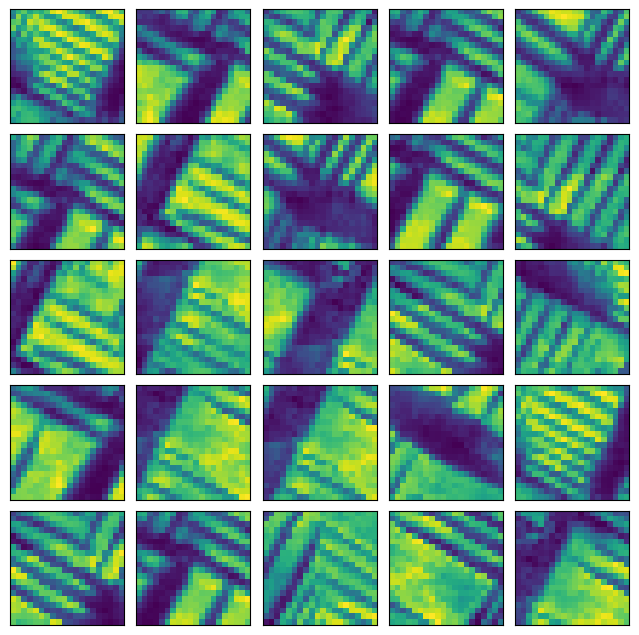

In [65]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[1] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_MU_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_MU_loader = pv.utils.init_dataloader(vae_MU_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_MU_data))
    ax.imshow(vae_MU_data[i].cpu(), interpolation='nearest')

In [66]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_MU = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_MU)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_MU_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 126962.9749
Epoch: 2 Training loss: 100986.2791
Epoch: 3 Training loss: 97763.2261
Epoch: 4 Training loss: 95035.1149
Epoch: 5 Training loss: 89909.6684
Epoch: 6 Training loss: 86733.8569
Epoch: 7 Training loss: 81429.4764
Epoch: 8 Training loss: 79853.1143
Epoch: 9 Training loss: 76797.3246
Epoch: 10 Training loss: 74678.1312
Epoch: 11 Training loss: 73092.9209
Epoch: 12 Training loss: 71602.8964
Epoch: 13 Training loss: 70504.7061
Epoch: 14 Training loss: 69938.4571
Epoch: 15 Training loss: 69366.7026
Epoch: 16 Training loss: 69242.2865
Epoch: 17 Training loss: 68087.8257
Epoch: 18 Training loss: 67719.4272
Epoch: 19 Training loss: 67365.8361
Epoch: 20 Training loss: 67002.0704
Epoch: 21 Training loss: 67226.7508
Epoch: 22 Training loss: 66358.5086
Epoch: 23 Training loss: 66200.0901
Epoch: 24 Training loss: 66209.7735
Epoch: 25 Training loss: 66039.0276
Epoch: 26 Training loss: 66811.1197
Epoch: 27 Training loss: 65689.0074
Epoch: 28 Training loss: 65100.4009

Text(0.5, 1.0, 'DKL-MU trajectory')

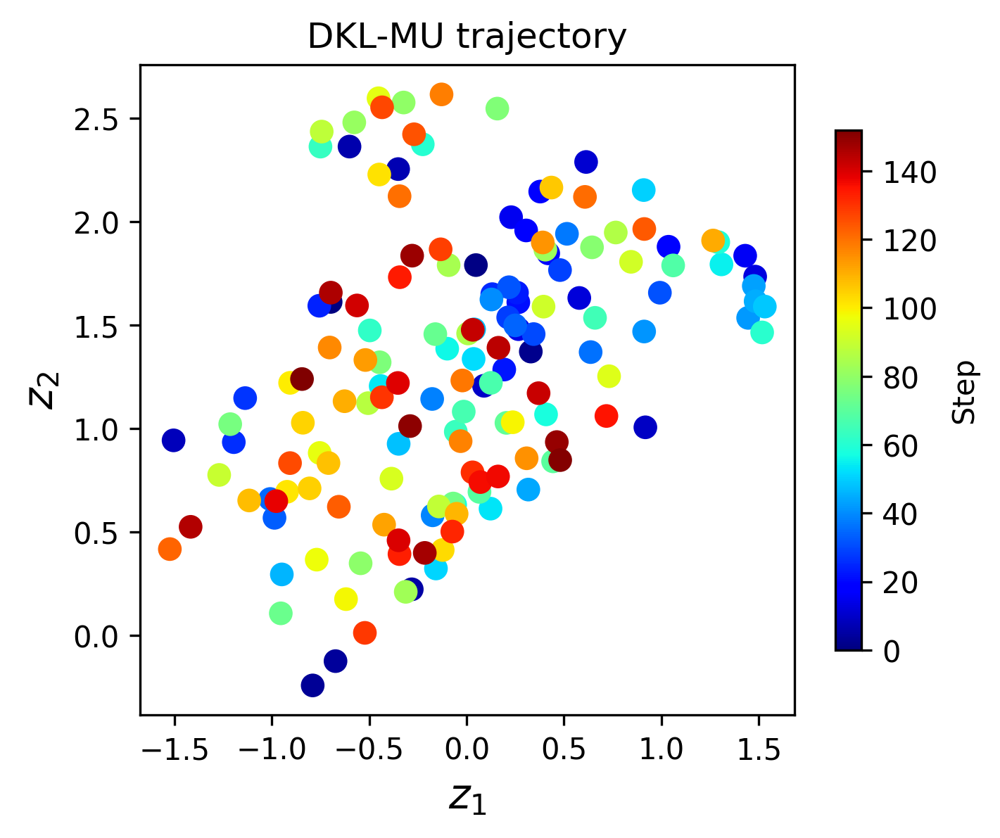

In [67]:
z_mean_MU, z_sd_MU = rvae_MU.encode(vae_MU_data)

plt.figure(figsize=(5, 4), dpi = 300)
plt.scatter(z_mean_MU[:, -2], z_mean_MU[:, -1], s=50, c=np.arange(len(vae_MU_data)), cmap = 'jet')
plt.xlabel("$z_1$", fontsize=14)
plt.ylabel("$z_2$", fontsize=14)
plt.colorbar(label = 'Step', shrink = 0.8)
plt.title("DKL-MU trajectory")
# plt.xlim (-0.5,3)
# plt.ylim (-2.3,1.2)

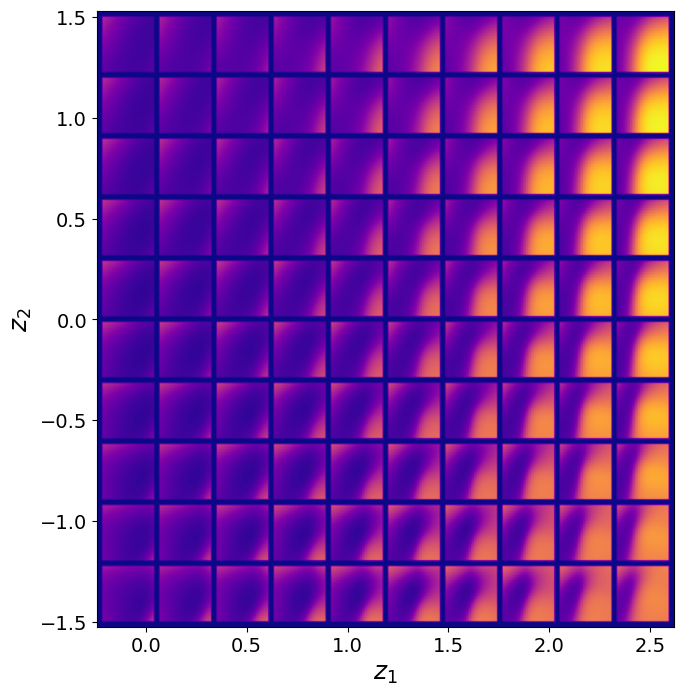

In [68]:
rvae_MU.manifold2d(10,
                   z_coord = [z_mean_MU[:, -1].min(), z_mean_MU[:, -1].max(), z_mean_MU[:, -2].min(), z_mean_MU[:, -2].max()],
                   cmap = 'plasma', dpi = 300);

UCB sampled data

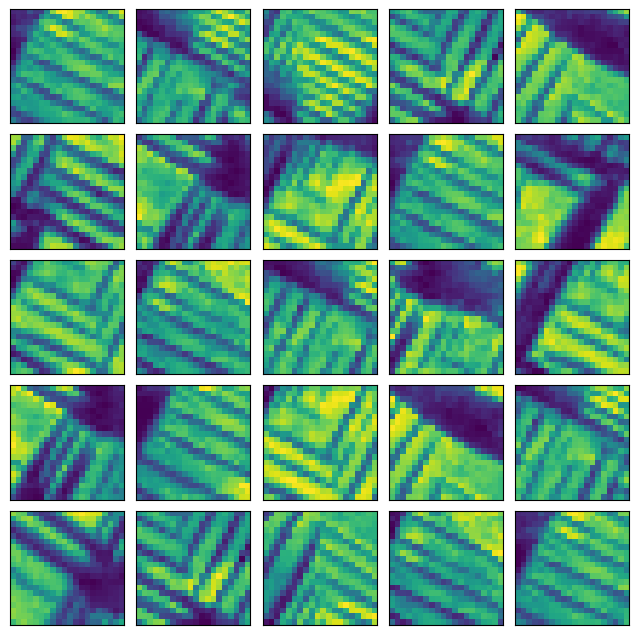

In [69]:
# Load DKL sampled data
os.chdir(rf + acq_funcs[2] + save_explore)
rec = np.load("final_traindata.npz")
X_train = rec['X_train']

# Initialize VAE train loader
vae_UCB_data = torch.tensor(X_train.reshape(-1, ws, ws)).float()
vae_UCB_loader = pv.utils.init_dataloader(vae_UCB_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_UCB_data))
    ax.imshow(vae_UCB_data[i].cpu(), interpolation='nearest')

In [70]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_UCB = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_UCB)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_UCB_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 94712.0977
Epoch: 2 Training loss: 85204.3659
Epoch: 3 Training loss: 81828.5414
Epoch: 4 Training loss: 81097.0939
Epoch: 5 Training loss: 77939.4689
Epoch: 6 Training loss: 75337.3954
Epoch: 7 Training loss: 74032.4379
Epoch: 8 Training loss: 68789.1956
Epoch: 9 Training loss: 67850.7277
Epoch: 10 Training loss: 69589.2855
Epoch: 11 Training loss: 72206.4366
Epoch: 12 Training loss: 67552.0523
Epoch: 13 Training loss: 63380.1875
Epoch: 14 Training loss: 64652.4220
Epoch: 15 Training loss: 63194.4906
Epoch: 16 Training loss: 60960.1494
Epoch: 17 Training loss: 60037.4609
Epoch: 18 Training loss: 59903.2176
Epoch: 19 Training loss: 59454.3746
Epoch: 20 Training loss: 58971.9742
Epoch: 21 Training loss: 59321.9307
Epoch: 22 Training loss: 59535.2368
Epoch: 23 Training loss: 60762.6116
Epoch: 24 Training loss: 63921.4287
Epoch: 25 Training loss: 66072.0268
Epoch: 26 Training loss: 63721.7140
Epoch: 27 Training loss: 59724.6274
Epoch: 28 Training loss: 60288.4607
E

Text(0.5, 1.0, 'DKL-UCB trajectory')

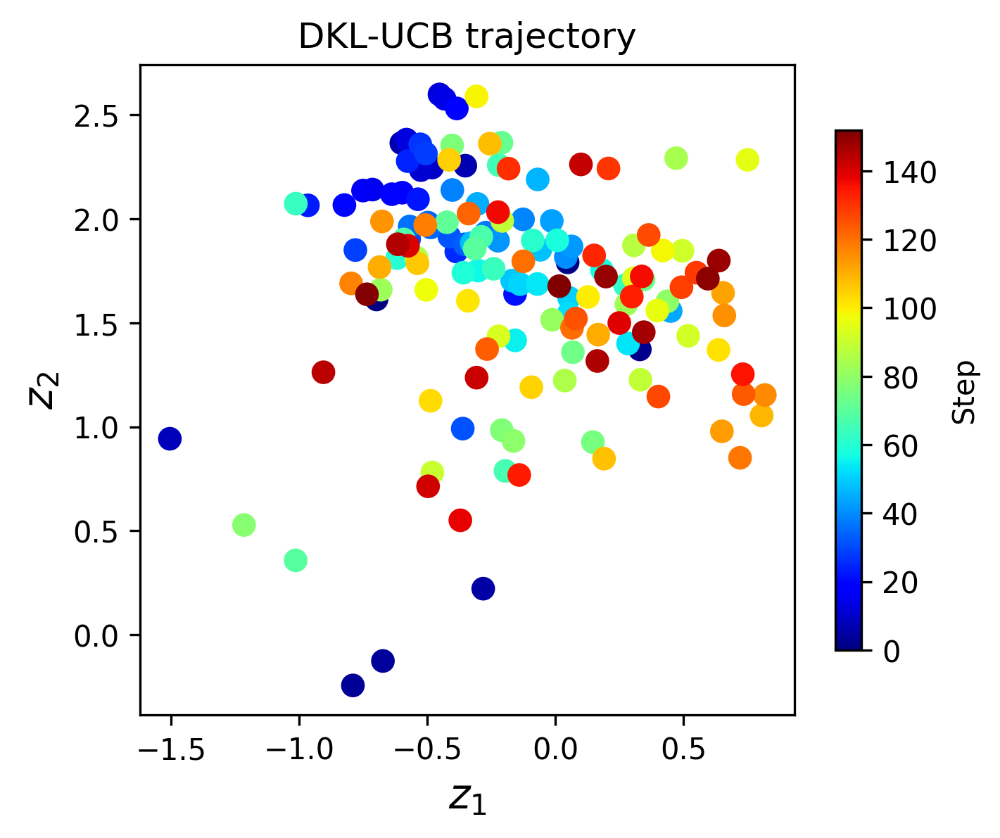

In [71]:
z_mean_UCB, z_sd_UCB = rvae_MU.encode(vae_UCB_data)

plt.figure(figsize=(5, 4), dpi = 300)
plt.scatter(z_mean_UCB[:, -2], z_mean_UCB[:, -1], s=50, c=np.arange(len(vae_UCB_data)), cmap = 'jet')
plt.xlabel("$z_1$", fontsize=14)
plt.ylabel("$z_2$", fontsize=14)
# plt.xlim(-0.1,2.9)
# plt.ylim(-1.7, 1.3)
plt.colorbar(label = "Step", shrink = 0.8)
plt.title("DKL-UCB trajectory")

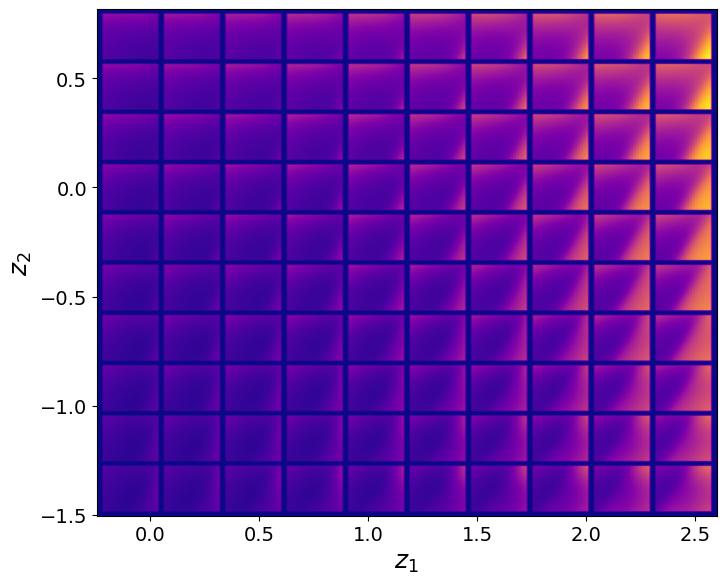

In [72]:
rvae_UCB.manifold2d(10,
                    z_coord = [z_mean_UCB[:, -1].min(), z_mean_UCB[:, -1].max(), z_mean_UCB[:, -2].min(), z_mean_UCB[:, -2].max()],
                    cmap = 'plasma', dpi = 300);

rVAE analysis on all patches

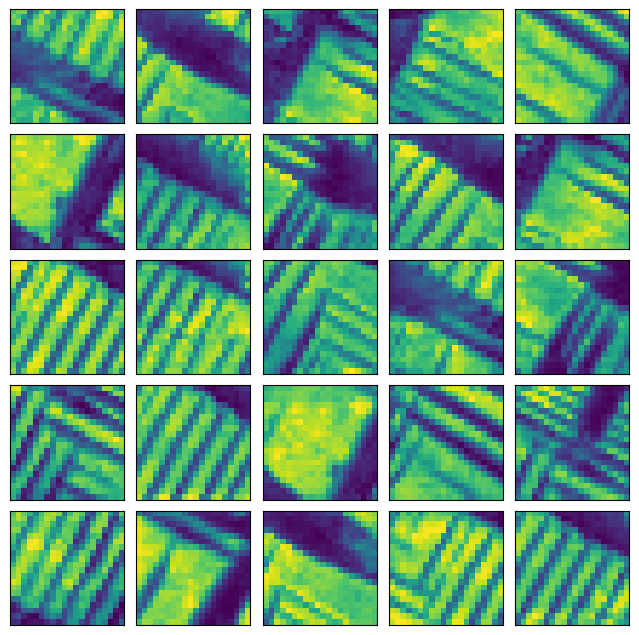

In [73]:
# Initialize VAE train loader
vae_all_data = torch.tensor(X.reshape(-1, ws, ws)).float()
vae_all_loader = pv.utils.init_dataloader(vae_all_data, batch_size=64, device = 'cuda')

np.random.seed(1)
fig, axes = plt.subplots(5, 5, figsize=(8, 8),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))
for ax in axes.flat:
    i = np.random.randint(len(vae_all_data))
    ax.imshow(vae_all_data[i].cpu(), interpolation='nearest')

In [74]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)
rvae_all = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_all)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_all_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 67492.7111
Epoch: 2 Training loss: 56175.9618
Epoch: 3 Training loss: 52464.2476
Epoch: 4 Training loss: 51121.6908
Epoch: 5 Training loss: 49277.4572
Epoch: 6 Training loss: 48763.2135
Epoch: 7 Training loss: 47542.6482
Epoch: 8 Training loss: 46713.2406
Epoch: 9 Training loss: 45941.0063
Epoch: 10 Training loss: 45222.4001
Epoch: 11 Training loss: 44455.2235
Epoch: 12 Training loss: 44118.9594
Epoch: 13 Training loss: 43995.5680
Epoch: 14 Training loss: 43142.8768
Epoch: 15 Training loss: 42829.6975
Epoch: 16 Training loss: 42591.8812
Epoch: 17 Training loss: 42282.1846
Epoch: 18 Training loss: 41721.0750
Epoch: 19 Training loss: 41356.6177
Epoch: 20 Training loss: 41317.7173
Epoch: 21 Training loss: 41061.8190
Epoch: 22 Training loss: 40875.7153
Epoch: 23 Training loss: 40771.7154
Epoch: 24 Training loss: 40492.2597
Epoch: 25 Training loss: 40035.2740
Epoch: 26 Training loss: 39893.5393
Epoch: 27 Training loss: 39819.4501
Epoch: 28 Training loss: 39601.4217
E

Text(0, 0.5, '$z_1$')

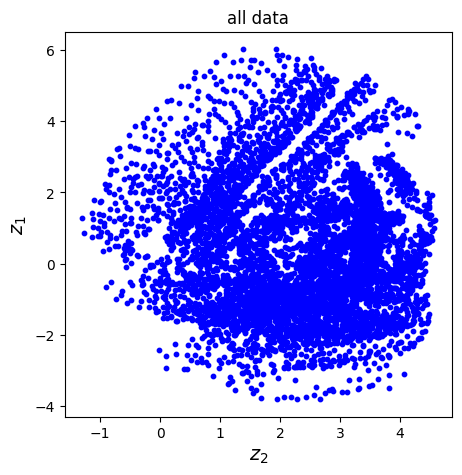

In [75]:
z_mean_all, z_sd_all = rvae_all.encode(vae_all_data)

plt.figure(figsize=(5, 5), dpi = 100)
plt.title('all data')
plt.scatter(z_mean_all[:, -1], z_mean_all[:, -2], s=10, c='blue')
plt.xlabel("$z_2$", fontsize=14)
plt.ylabel("$z_1$", fontsize=14)

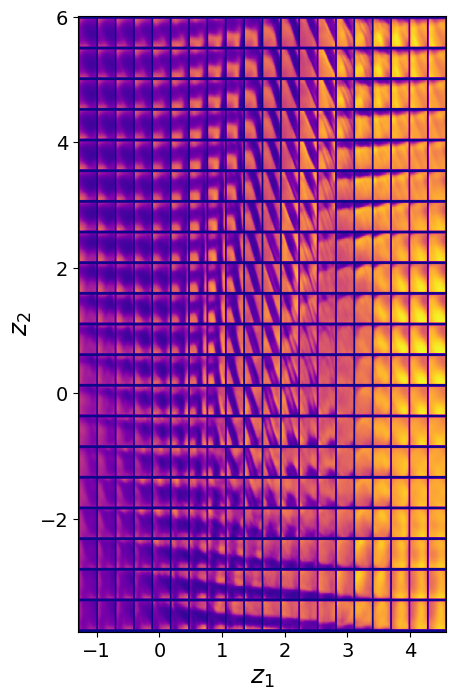

In [76]:
rvae_all.manifold2d(20,
                    z_coord = [z_mean_all[:, -1].min(), z_mean_all[:, -1].max(), z_mean_all[:, -2].min(), z_mean_all[:, -2].max()],
                    cmap = 'plasma', dpi = 300);

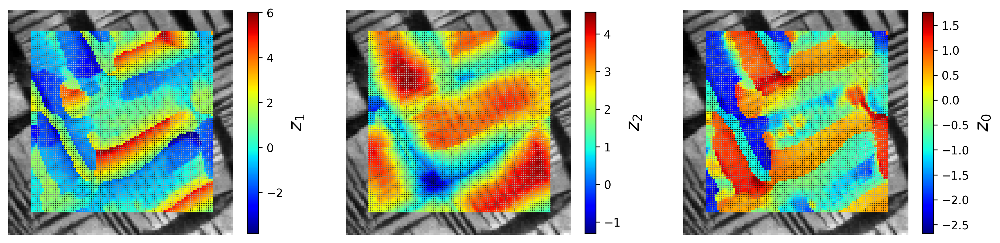

In [77]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5), dpi = 300)
ax1.imshow(patch_image, origin = "lower", cmap = 'gray')
im1=ax1.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-2], cmap = 'jet')
ax1.axis(False)
cbar1 = fig.colorbar(im1, ax=ax1, shrink=.7)
cbar1.set_label("$z_1$", fontsize=16)

ax2.imshow(patch_image, origin = "lower", cmap = 'gray')
im2=ax2.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-1], cmap = 'jet')
ax2.axis(False)
cbar2 = fig.colorbar(im2, ax=ax2, shrink=.7)
cbar2.set_label("$z_2$", fontsize=16)

im3=ax3.imshow(patch_image, origin = "lower", cmap = 'gray')
im3=ax3.scatter(indices_all[:,1], indices_all[:,0], s=1, c = z_mean_all[:,-3], cmap = 'jet')
ax3.axis(False)
cbar3 = fig.colorbar(im3, ax=ax3, shrink=.7)
cbar3.set_label("$z_0$", fontsize=16)

Plot samplings (from different acquition functions) distribution in the latent space of all patches

In [78]:
import pandas as pd
import seaborn as sns

z1 = np.asarray(z_mean_all, dtype = np.float32);
z2 = np.asarray(z_mean_EI, dtype = np.float32)
d = np.append(z1, z2, axis = 0)

s = pd.DataFrame({"z0": d[:,0], "z1": d[:,1], "z2": d[:,2], "Data": 'All Data'})
s['Data'][len(z1):] = "DKL Train Data"

<ipython-input-78-d5a19ba50145>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  s['Data'][len(z1):] = "DKL Train Data"


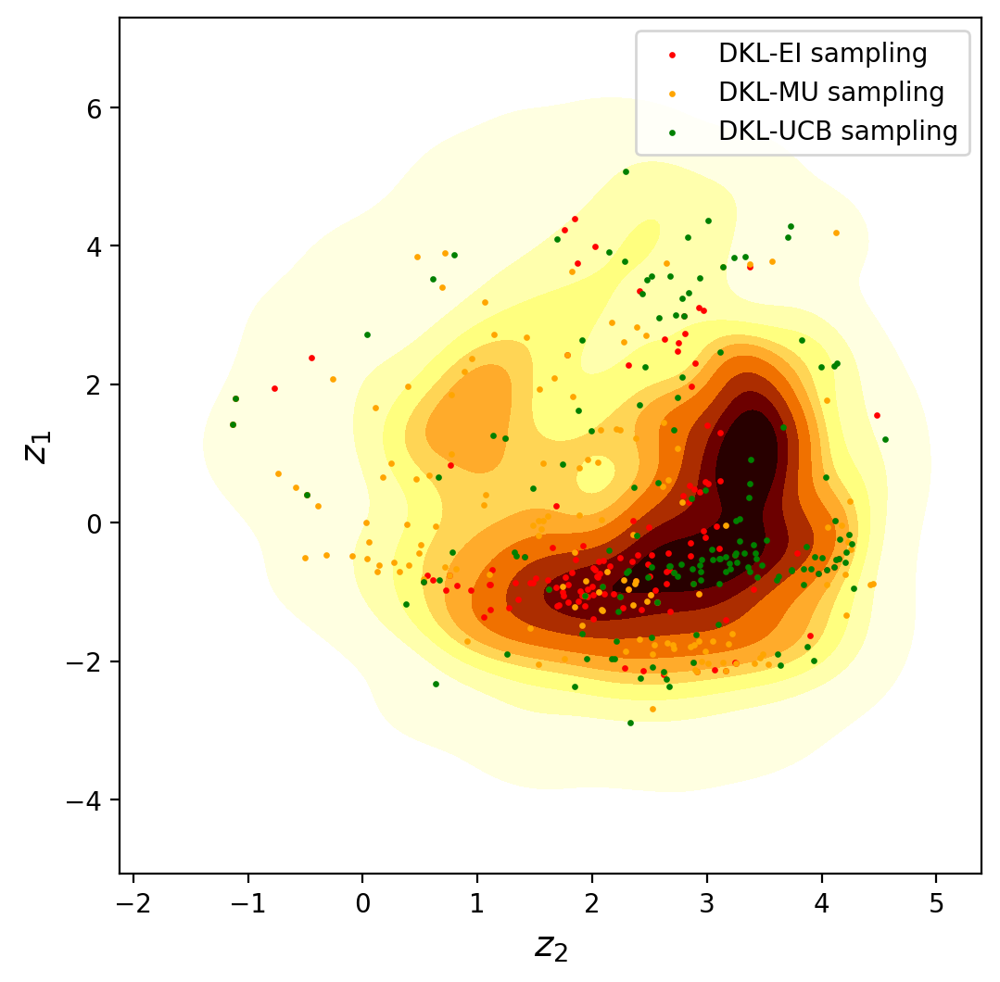

In [86]:
z_mean_all_EI, z_sd_all_EI = rvae_all.encode(vae_EI_data)
z_mean_all_MU, z_sd_all_MU = rvae_all.encode(vae_MU_data)
z_mean_all_UCB, z_sd_all_UCB = rvae_all.encode(vae_UCB_data)

f, ax = plt.subplots(figsize = (6,6), dpi = 200)

data = z1
s = pd.DataFrame({"z0": data[:,0], "z1": data[:,1], "z2": data[:,2]})
ax = sns.kdeplot(data=s, x = "z2", y = "z1", fill=True, thresh=0.01, levels=10, cmap="afmhot_r")
# ax.set_ylim(-5, 5)
# ax.set_xlim(-5, 5)

#ax.scatter(z_mean_all[:, -1], z_mean_all[:, -2], c = 'gray', s=0.5, label = "Full patches")
ax.scatter(z_mean_all_EI[:, -1], z_mean_all_EI[:, -2], c='r', marker = 'o', s=2, label = "DKL-EI sampling")
ax.scatter(z_mean_all_MU[:, -1], z_mean_all_MU[:, -2], c='orange', marker = 'o', s=2, label = "DKL-MU sampling")
ax.scatter(z_mean_all_UCB[:, -1], z_mean_all_UCB[:, -2], c='green', marker = 'o', s=2, label = "DKL-UCB sampling")
ax.set_xlabel("$z_2$", fontsize=14)
ax.set_ylabel("$z_1$", fontsize=14)

ax.legend()